## Fig S2 d)

### Protein. Bone Marrow (BM) + Spleen (SPL) 
### ADT QC steps + DSB + filtering clusters
---
##### mq224

Date: 2021-01-19

In [2]:
#SETTING ENVIRONMENT 
import rpy2

import numpy as np
import pandas as pd
import scanpy as sc

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80, dpi_save=1000)

In [3]:
from matplotlib.colors import LinearSegmentedColormap
cmap = LinearSegmentedColormap.from_list(name='gene_cmap', colors=['lightgrey', 'thistle', 'red', 'darkred']) 

# Read protein data 

In [3]:
DSB_output0 = sc.read("h5ad_part1/20210119_part1_Laurenti_mq224_ADT_postQC_DSB_FDG_BM_SPL_SIGAB11_SIGAD11.h5ad") #Post DSB normalisation
adata = sc.read("h5ad_part1/20210119_part1_Laurenti_mq224_A_ADT_postQC_BM_SPL_SIGAB11_SIGAD11.h5ad") #postQC without DSB normalisation
adata.obs["leiden"] = DSB_output0.obs["leiden"] #We save the clusters on this object

In [4]:
adata = adata[~adata.obs['leiden'].isin(['10']),:].copy() #Exclude the cluster 10

In [5]:
adata_initial = sc.read("h5ad_part1/20210119_part1_Laurenti_mq224_A_ADT_raw_QC_steps_BM_SPL_SIGAB11_SIGAD11.h5ad") #Take the raw data. Initial as before

In [6]:
adata_qc=adata.copy() #Post qc 

In [7]:
adata_qc.write("h5ad_part2/20210119_Laurenti_mq224_ADT_postQC_filtered_BM_SPL_SIGAB11_SIGAD11.h5ad")
#postQC adata without cluster 10. Remember this object has to be DSB normalised.

In [8]:
import numpy as np
from sklearn.mixture import GaussianMixture
import anndata

cell_protein_matrix = adata_qc.copy()

### DSB METHOD - CLUSTERING AND VISUALIZATION

In [9]:
cell_protein_matrix = adata_initial[adata_qc.obs_names,:].copy()

cell_protein_matrix.shape

(29463, 198)

In [10]:
# adata here must be the read in from raw umi matrix
#We need to define empty droplets. 
#You split out the data. You assign how many cells as empty droplets 
def getNegDroplets(adata, lamda=5): 
    #lamda controls how many empty droplets you will have in the end.
    #Its very hard to tell which is the number of empty droplets.
    umi = np.log1p(np.sum(adata.X.toarray(), axis=1)) #umis per cell
    mu_umi = np.mean(umi) #mean of umi counts
    sd_umi = np.std(umi) #SD of the umi counts 
    print(mu_umi)
    print(sd_umi)
    sub_threshold = mu_umi-(lamda*sd_umi) 
    print(sub_threshold)
    plt.hist(umi, bins = 100)
    plt.axvline(x=sub_threshold,color='red')
    #Simplified version. They used Seurat function,  but we dont want that.
    #anything less than that would be empty droplets.
    return adata[umi<sub_threshold,:].copy()
    #any cell that has umi counts < threshold. 

6.0024734
0.466016
5.652961358428001
(4194, 198)


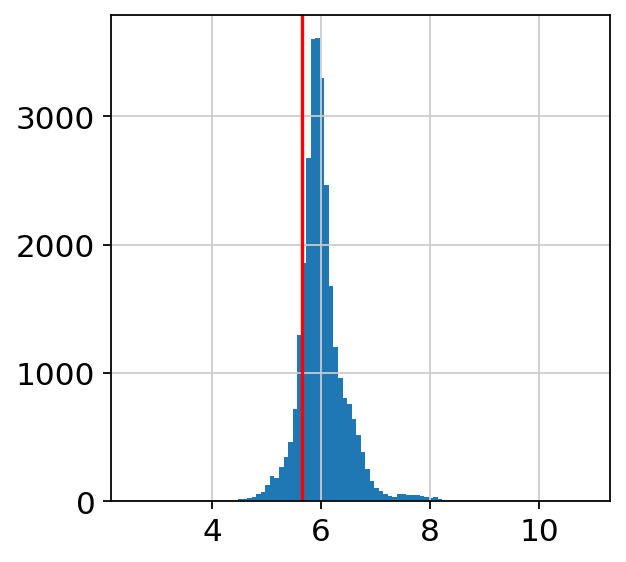

In [11]:
import matplotlib.pyplot as plt

empty_drop_matrix = getNegDroplets(adata_initial, lamda=0.75)
print(empty_drop_matrix.shape)

In [12]:
#renormalisation of the counts by empty droplets background.
#cell_protein_matrix and empty_drop_matrix are split from the same matrix,
#only difference is cells, but Ab is the same.
#cell_protein_matrix: adata object.
def DSB(cell_protein_matrix, empty_drop_matrix, pseudocount=10):
    adt = cell_protein_matrix.X.toarray() #meaningful cells xantibodies
    adtu = empty_drop_matrix.X.toarray() #the non meaninful - empty droplets 
    adt_log = np.log(adt+pseudocount) 
    adtu_log = np.log(adtu+pseudocount)
    mu_u = np.mean(adtu_log, axis=0) #for each protein in empty drop.
    sd_u = np.std(adtu_log, axis=0) #for each protein in empty drop.
    norm_adt = (adt_log-mu_u)/sd_u  #Y=log(Xi+P)-mu / sd
    adata_new = anndata.AnnData(X=norm_adt, obs=cell_protein_matrix.obs, var=cell_protein_matrix.var)
    #new normalised values
    print(adata_new.shape)
    cellwise_background_mean = np.array([]) #equation 2 from this line.
    for column in norm_adt.T:
        gmm = GaussianMixture(n_components=2) #for each protein
        gmm.fit(column.reshape(-1,1)) #you fit it
        cellwise_background_mean= np.append(cellwise_background_mean,gmm.means_[0])
        #you get the mean for the background
    print(len(cellwise_background_mean))
    adata_new.var['bg_mean'] = cellwise_background_mean #contains all the new normalised umi counts.
    #save it for the regression function, which we wont use!
    return adata_new

In [13]:
adata_new = DSB(cell_protein_matrix, empty_drop_matrix, pseudocount = 5)
cell_protein_matrix.shape

(29463, 198)
198


(29463, 198)

In [14]:
adata_new.raw = adata_new

adata_new1=adata_new.copy().T

adata_new2 = adata_new1.T

adata_new2.raw = adata_new

DSB_output0 = adata_new2.copy()

In [15]:
DSB_output0

AnnData object with n_obs × n_vars = 29463 × 198
    obs: 'Tissue', 'batch'
    var: 'bg_mean'

In [16]:
DSB_output0.raw = DSB_output0

In [17]:
DSB_output0.write("h5ad_part2/20210119_Laurenti_mq224_ADT_postQC_filtered_DSB_BM_SPL_SIGAB11_SIGAD11.h5ad")

In [18]:
sc.tl.pca(DSB_output0, svd_solver='arpack')

computing PCA
    with n_comps=50
    finished (0:00:00)


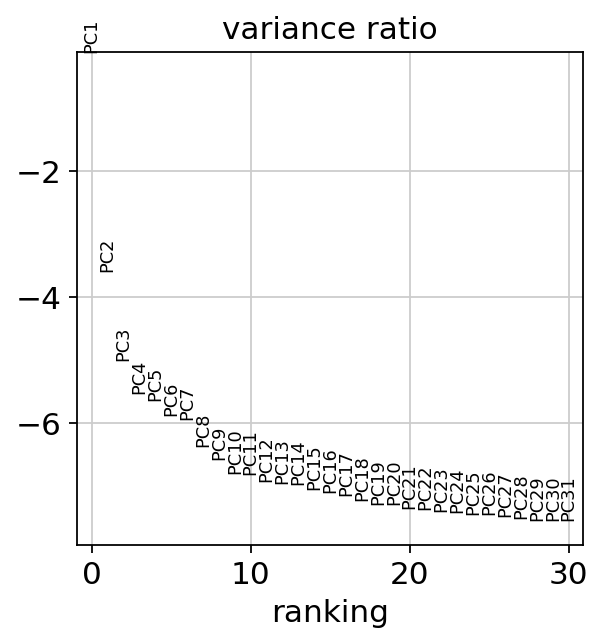

In [19]:
sc.pl.pca_variance_ratio(DSB_output0, log=True)

In [20]:
sc.pp.neighbors(DSB_output0, n_neighbors=40, n_pcs=10)

computing neighbors
    using 'X_pca' with n_pcs = 10


/usr/local/lib/python3.7/dist-packages/numba/core/typed_passes.py:314: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../../../../../../../../usr/local/lib/python3.7/dist-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/usr/local/lib/python3.7/dist-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see https://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../../../../../../../../../../../../../../.

    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:20)


In [21]:
sc.tl.umap(DSB_output0)
sc.tl.draw_graph(DSB_output0)
sc.tl.leiden(DSB_output0, resolution=0.5)
sc.tl.louvain(DSB_output0, resolution=0.5)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:33)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:04:09)
running Leiden clustering
    finished: found 10 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:30)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 9 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:13)


In [22]:
DSB_output0.write("h5ad_part2/20210119_Laurenti_mq224_ADT_postQC_filtered_DSB_FDG_BM_SPL_SIGAB11_SIGAD11.h5ad")

In [23]:
markers = ['CD19', 'IgG_Fc', 'CD45RA', 'CD81', 'IgM', 'CD10', 'CD22',
       'integrin_b7', 'CD24', 'CD105', 'CD72', 'CD9']

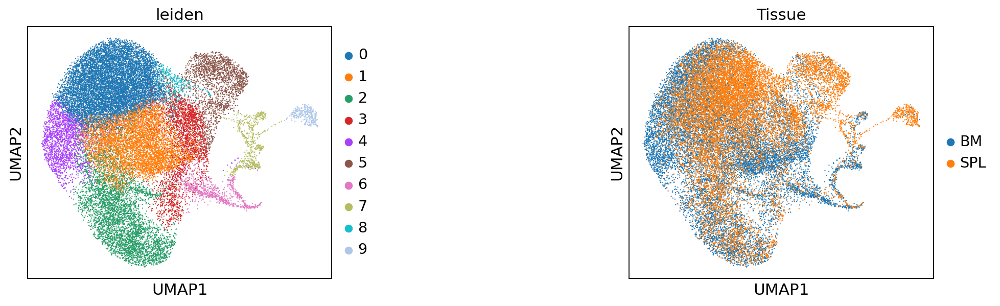

In [24]:
sc.pl.umap(DSB_output0, color=['leiden','Tissue'], ncols=2, wspace = 0.8, cmap=cmap)

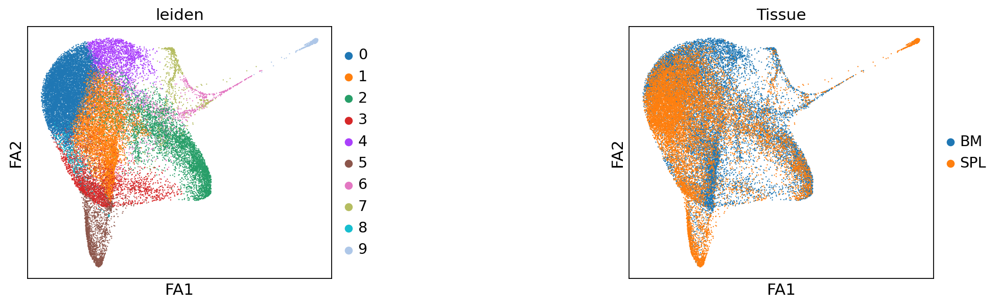

In [25]:
sc.pl.draw_graph(DSB_output0, color=['leiden','Tissue'], ncols=2, wspace = 0.8, cmap=cmap)

# Import mRNA labels

In [26]:
UMAP_metadata = pd.read_csv("/home/mq224/rds/rds-bg200-hphi-gottgens/users/mq224/project_citeseq/part2citeseq/PhD/Year_1/Collaborations/Laurenti_Lab/Data/Paper_landscape/20210119_DONOR4_FILTERED_metadata_and_UMAP_coords.txt", sep='\t')

UMAP_metadata = pd.DataFrame(UMAP_metadata)
UMAP_metadata.index = UMAP_metadata["Unnamed: 0"]
UMAP_metadata["Tissue"] = UMAP_metadata["organ"]  
meta_SPL = UMAP_metadata.groupby(UMAP_metadata.Tissue)
meta_SPL = meta_SPL.get_group("SPL")
meta_BM = UMAP_metadata.groupby(UMAP_metadata.Tissue)
meta_BM = meta_BM.get_group("BM")


In [27]:
cells1 = pd.Index(meta_BM["Unnamed: 0"]).astype(str)
cells2 = pd.Index(meta_SPL["Unnamed: 0"]).astype(str)

In [28]:
#for BM
new1 =[]
for cell in cells1:
    cell = cell.replace('_04_',"")
    cell = cell.replace('.1',"")
    new1.append(cell)
    
#new1 = pd.Index([x[:-2] for x in new1])
new1 = pd.Index([x+"-0" for x in new1])

In [29]:
#for SPL
new2 =[]
for cell in cells2:
    cell = cell.replace('_04_',"")
    cell = cell.replace('.1',"")
    new2.append(cell)

new2 = pd.Index([x[:-2] for x in new2])
new2 = pd.Index([x+"-1" for x in new2])

In [30]:
meta_BM.index = new1
meta_SPL.index= new2

In [31]:
len("AAACCCAAGATGTTCC-1")
len("AAACCCAAGAACGTGC-2")

18

In [32]:
meta_BM_SPL= pd.concat([meta_BM, meta_SPL], join="inner")

In [33]:
DSB_output0.obs_names

Index(['TCCCATGAGTCATGGG-0', 'TTGATGGAGAAACTCA-0', 'ATCATTCCACCATATG-0',
       'TCTATACCAGCTATTG-0', 'GGGCCATCAAATGGAT-0', 'CAACGGCCACTCCGGA-0',
       'ACGGTCGCATAATGCC-0', 'CACAGATGTCGCAACC-0', 'AAGACAAAGCCTCTCT-0',
       'CGGGCATTCAAGGCTT-0',
       ...
       'TGCTCCATCAACGCTA-1', 'AGATCCATCGTGTGGC-1', 'TTGCATTTCCATCTCG-1',
       'TCCATGCAGCCATTCA-1', 'TAAGCACAGCGAGTCA-1', 'GGAGGTAAGGTTCATC-1',
       'GCCAGCATCAGCGCGT-1', 'TGCGGCAGTGATGAAT-1', 'TAGGTTGAGATGTTCC-1',
       'CAAGAGGCAGTCGAGA-1'],
      dtype='object', length=29463)

In [34]:
# get the overlapping genes between mRNA and AB
OL1 = np.intersect1d(meta_BM_SPL.index, DSB_output0.obs_names)
print(len(OL1))

24322


In [35]:
len(np.unique(list(OL1)))

24322

In [36]:
len(np.unique(DSB_output0.obs_names))

29463

In [37]:
DSB_output0 = DSB_output0[OL1,:].copy()

In [38]:
meta_BM_SPL = meta_BM_SPL.loc[OL1,:]

In [39]:
DSB_output0.obs["leiden.1.2"] = meta_BM_SPL["leiden.1.2"].astype('category')
DSB_output0.obs["Annotations.1.2"] = meta_BM_SPL["leiden.1.2"].astype('category')

In [40]:
new_cluster_names =["CL0_HSC/MPP2","CL1_LyP2","CL2_MEP2","CL3_LyP3","CL4_HSC/MPP1",
 "CL5_HSC/MPP3","CL6_MyP1","CL7_HSC/MPP to CMP","CL8_late EryP","CL9_MyP2","CL10_HSC/MPP to MEP","CL11_HSC/MPP4",
 "CL12_MEP1","CL13_MEP cycling","CL14_ND","CL15_MyP4 (GMP)","CL16_MyP3 (cycling)","CL17_EoBasoMCP","CL18_LyP1",
 "CL19_cycling prog. (Ery/My)","CL21_HSC/MPP5","CL22_MkP","CL23_EryP/MyP mix","CL24_MDP"]

DSB_output0.rename_categories('Annotations.1.2', new_cluster_names)

In [41]:
HSCs=["CD34", "CD38", "CD45RA", "CD90", "CD49f", "CD123", "CD117", "CD133", "CD10", "CD7"]

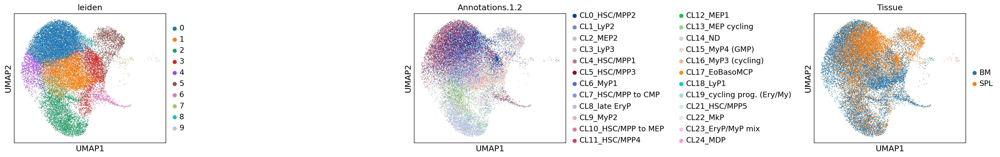

In [42]:
sc.pl.umap(DSB_output0, color=['leiden',"Annotations.1.2",'Tissue'], ncols=3, wspace = 1.4, cmap=cmap)

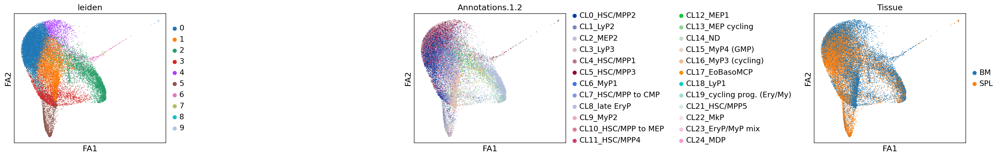

In [43]:
sc.pl.draw_graph(DSB_output0, color=['leiden',"Annotations.1.2",'Tissue'], ncols=3, wspace = 1.4, cmap=cmap)

In [44]:
DSB_output0

AnnData object with n_obs × n_vars = 24322 × 198
    obs: 'Tissue', 'batch', 'leiden', 'louvain', 'leiden.1.2', 'Annotations.1.2'
    var: 'bg_mean'
    uns: 'pca', 'neighbors', 'umap', 'draw_graph', 'leiden', 'louvain', 'leiden_colors', 'Tissue_colors', 'Annotations.1.2_colors'
    obsm: 'X_pca', 'X_umap', 'X_draw_graph_fa'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [45]:
#DSB_output0.write("h5ad_part2/20210218_Laurenti_mq224_ADTwithmRNAlabels_postQC_filtered_DSB_FDG_BM_SPL_SIGAB11_SIGAD11.h5ad")

In [6]:
DSB_output0 = sc.read("h5ad_part2/20210218_Laurenti_mq224_ADTwithmRNAlabels_postQC_filtered_DSB_FDG_BM_SPL_SIGAB11_SIGAD11.h5ad")

# Markers expression on protein based UMAP landscape

In [9]:
HSC_MPP =["CD34", "CD38", "CD90", "CD49f", "CD45RA", "CD370", "CD110", "CD44", "CD99","CD82", "CD275"]
Ery_Meg_Eo_Baso_MCP = ["CD36", "CD71", "CD326", "CD41", "CD61","CD131"]
MyP_MDP = ["CD135", "CD33", "CD371", "CD103", "integrin_b7"]
LyP = ["CD10", "CD22", "CD56", "CD19"]

markers = HSC_MPP+Ery_Meg_Eo_Baso_MCP+MyP_MDP+LyP

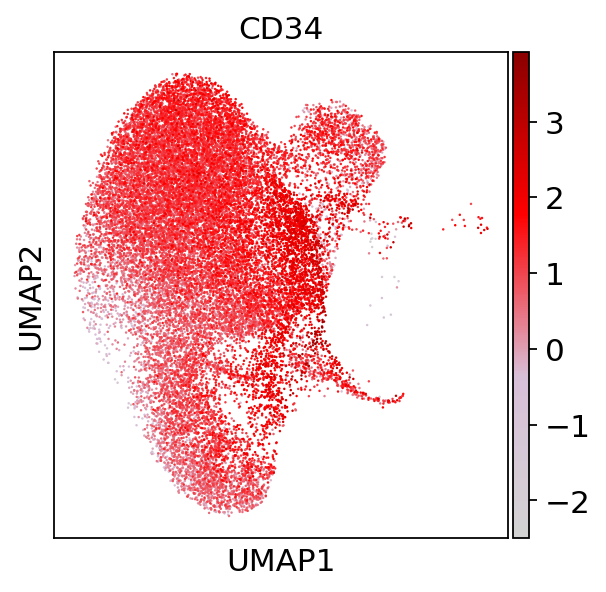

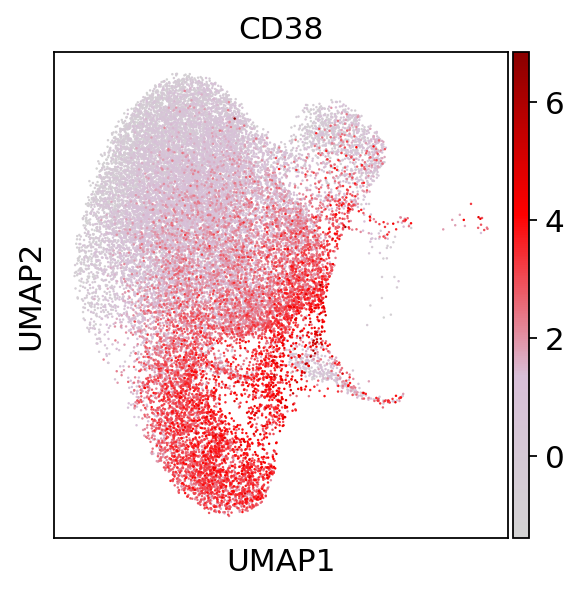

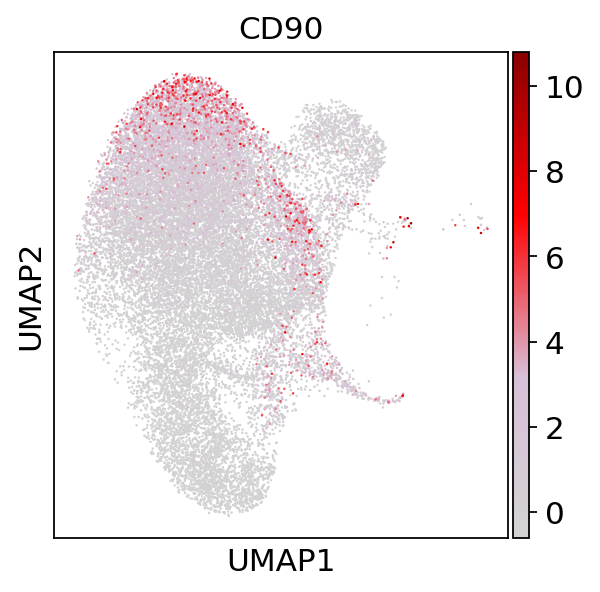

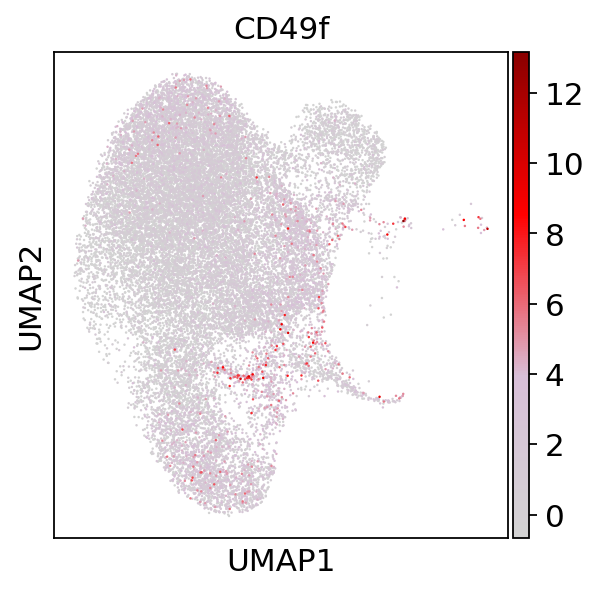

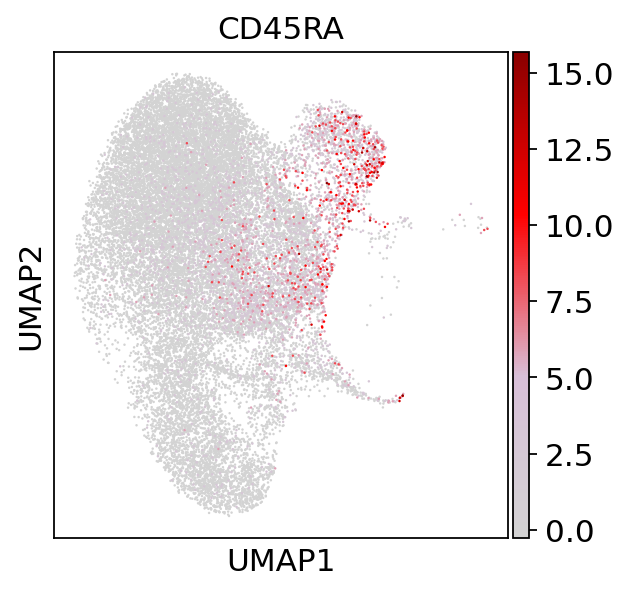

...

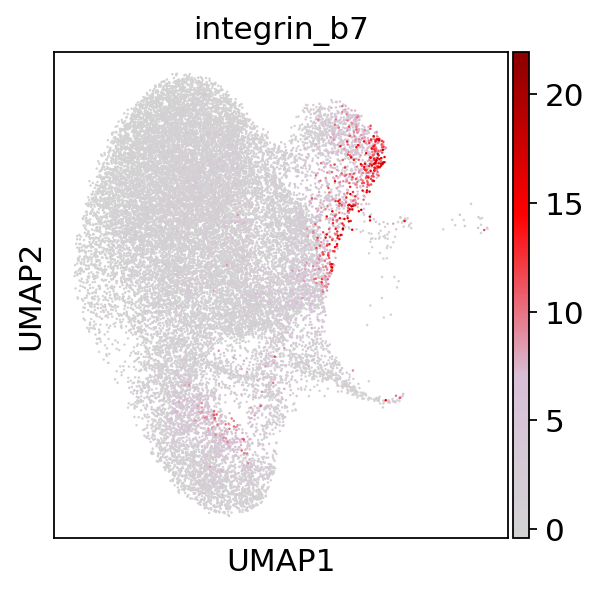

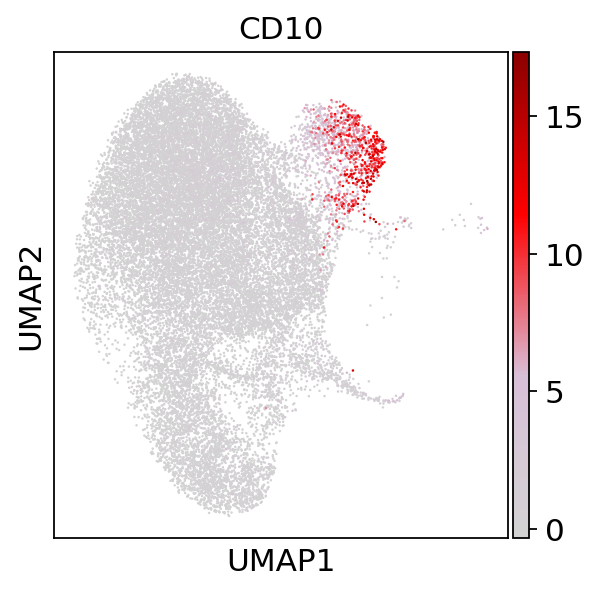

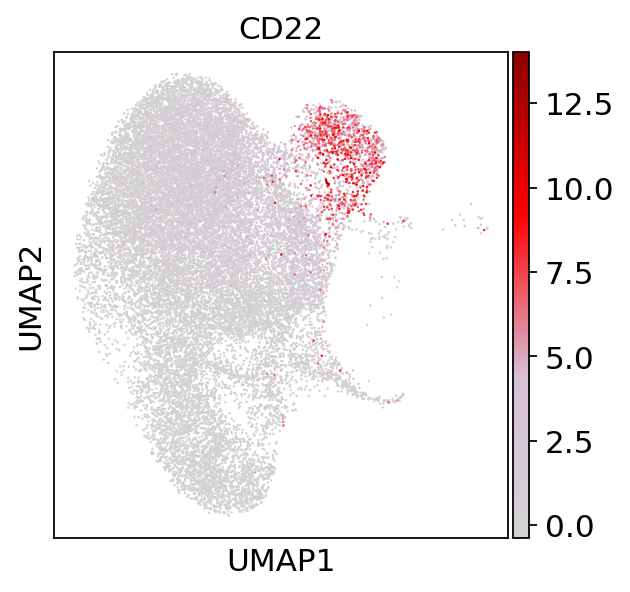

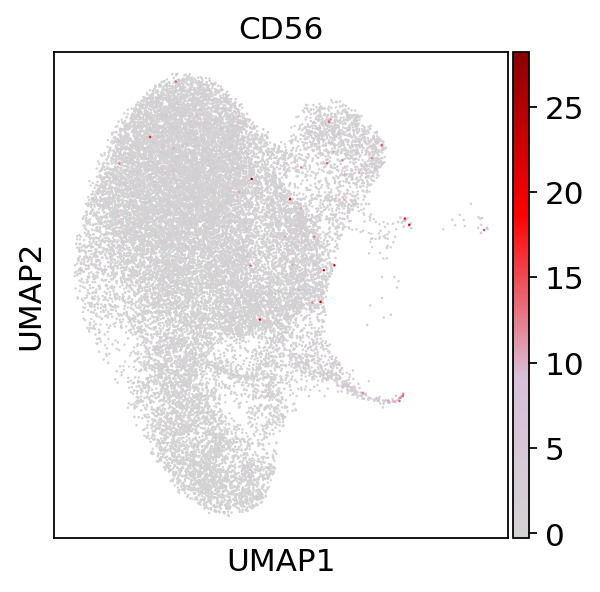

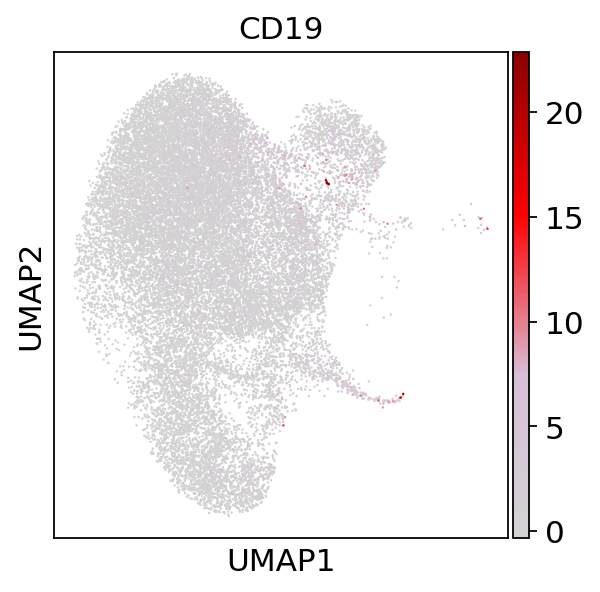

In [11]:
for prot in markers:
    sc.pl.umap(DSB_output0, color=prot, ncols=5, wspace = 0.5,cmap=cmap, save=prot+"-20210218_DSB_normalised_ADTbasedUMAPs_BM-SPL-cmap")